In [1]:
!pip install yolov5

In [2]:
import yolov5
import cv2
import easyocr


YOLOv5  2023-11-4 Python-3.9.7 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Adding AutoShape... 


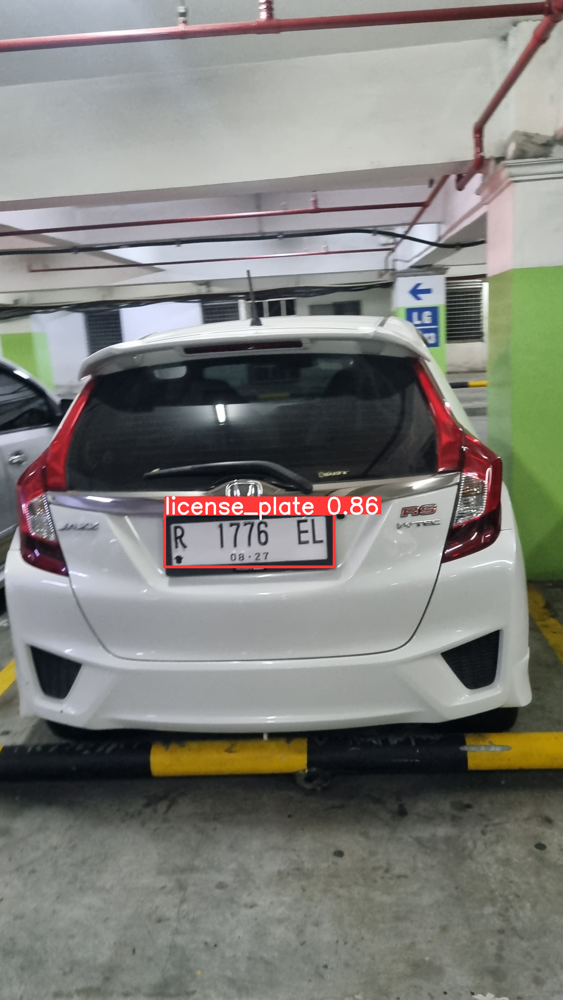

Saved 1 image to results


In [3]:

# load model
model = yolov5.load('keremberke/yolov5m-license-plate')
  
# set model parameters
model.conf = 0.25  # NMS confidence threshold
model.iou = 0.45  # NMS IoU threshold
model.agnostic = False  # NMS class-agnostic
model.multi_label = False  # NMS multiple labels per box
model.max_det = 1000  # maximum number of detections per image

# set image
img = 'D:/Coding/Projects/number-plate-recognition/data/K4_R1776EL.jpg'

# perform inference
results = model(img, size=640)

# inference with test time augmentation
results = model(img, augment=True)

# parse results
predictions = results.pred[0]
boxes = predictions[:, :4] # x1, y1, x2, y2
scores = predictions[:, 4]
categories = predictions[:, 5]

# show detection bounding boxes on image
results.show()

# save results into "results/" folder
results.save(save_dir='results/')


In [4]:
boxes[0]

tensor([ 658.06525, 2056.76611, 1336.55457, 2267.30957])

### Ambil crop hasil box

In [5]:
# Baca gambar
image = cv2.imread(img)

# Koordinat x1, y1, x2, y2
x1, y1, x2, y2 = boxes[0]

# Crop gambar dari koordinat yang diberikan
cropped_image = image[int(y1):int(y2), int(x1):int(x2)]

# Simpan gambar yang telah di-crop
cv2.imwrite("hasil_cropped.jpg", cropped_image)

# # Tampilkan gambar hasil crop
# cv2.imshow("Gambar Hasil Crop", cropped_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

True

## OCR

In [6]:
from matplotlib import pyplot as plt
import numpy as np
import imutils

In [7]:
# Melakukan text recognition dengan easy ocr
reader = easyocr.Reader(['en'])
result = reader.readtext(cropped_image)
result

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


[([[33, 45], [93, 45], [93, 141], [33, 141]], 'R', 0.9921750917165504),
 ([[192, 13], [435, 13], [435, 152], [192, 152]], '1776', 0.9886837005615234),
 ([[520, 8], [648, 8], [648, 134], [520, 134]], 'EL', 0.9995218353474603),
 ([[256, 142], [425, 142], [425, 195], [256, 195]],
  '08.27',
  0.9967023826660779)]

In [8]:
# top_left = tuple(result[0][0][0])
# bottom_right = tuple(result[0][0][2])
# text = result[0][1]
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 3 # Skala font
font_thickness = 5  # Ketebalan font
font_color = (0, 255, 0)  # Warna biru (BGR)

In [9]:
text_to_write = " ".join([res[1] for res in result])

# Koordinat dari tensor yang diberikan
x1, y1, x2, y2 = boxes[0]

# Gambar rectangle
imgDraw = cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), font_color, font_thickness)  # font_color adalah warna merah

# Tulis kata
imgDraw3 = cv2.putText(imgDraw, text_to_write, (int(x1), int(y1) - 10), font, font_scale, font_color, font_thickness)  # font_color adalah warna merah

# Simpan gambar yang telah dimodifikasi
cv2.imwrite("imgDraw3.jpg", imgDraw3)

True

In [10]:
# img = cv2.imread(img)
imgDraw = cv2.rectangle(image,top_left,bottom_right,(0,255,0),3)
imgDraw2 = cv2.putText(imgDraw,text_to_write,bottom_right, font, 0.5,(0,255,0),2,cv2.LINE_AA)
plt.figure(figsize=(10,10))
cv2.imwrite("hasilll.jpg", imgDraw2)

# plt.imshow(img)
# plt.show()

NameError: name 'top_left' is not defined